# Section 1: EDA for the dataset

## Import the lib 

In [2]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import seaborn as sns
import plotly.express as px

## Load the dataset 

In [41]:
df = pd.read_csv("telecom_churn.csv")

## Data Inspection

In [4]:
# See the head of the data
df.head()

,customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
0,1,Reliance Jio,F,25,Karnataka,Kolkata,755597,2020-01-01,4,124962,44,45,-361,0
1,2,Reliance Jio,F,55,Mizoram,Mumbai,125926,2020-01-01,2,130556,62,39,5973,0
2,3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1
3,4,BSNL,M,46,Tamil Nadu,Kolkata,522841,2020-01-01,1,38722,80,25,9377,1
4,5,BSNL,F,26,Tripura,Delhi,740247,2020-01-01,2,55098,78,15,1393,0


In [5]:
# See the shape of the dataframe 
df.shape 

(243553, 14)

In [6]:
# See the if there is any missing values 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243553 entries, 0 to 243552
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   customer_id           243553 non-null  int64 
 1   telecom_partner       243553 non-null  object
 2   gender                243553 non-null  object
 3   age                   243553 non-null  int64 
 4   state                 243553 non-null  object
 5   city                  243553 non-null  object
 6   pincode               243553 non-null  int64 
 7   date_of_registration  243553 non-null  object
 8   num_dependents        243553 non-null  int64 
 9   estimated_salary      243553 non-null  int64 
 10  calls_made            243553 non-null  int64 
 11  sms_sent              243553 non-null  int64 
 12  data_used             243553 non-null  int64 
 13  churn                 243553 non-null  int64 
dtypes: int64(9), object(5)
memory usage: 26.0+ MB


In [7]:
# See the describtion of the dataframe 
df.describe()

,customer_id,age,pincode,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
count,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000
mean,121777.000000,46.077609,549501.270541,1.997500,85021.137839,49.010548,23.945404,4993.186025,0.200478
std,70307.839393,16.444029,259808.860574,1.414941,37508.963233,29.453556,14.733575,2942.019547,0.400359
min,1.000000,18.000000,100006.000000,0.000000,20000.000000,-10.000000,-5.000000,-987.000000,0.000000
25%,60889.000000,32.000000,324586.000000,1.000000,52585.000000,24.000000,11.000000,2490.000000,0.000000
50%,121777.000000,46.000000,548112.000000,2.000000,84990.000000,49.000000,24.000000,4987.000000,0.000000
75%,182665.000000,60.000000,774994.000000,3.000000,117488.000000,74.000000,36.000000,7493.000000,0.000000
max,243553.000000,74.000000,999987.000000,4.000000,149999.000000,108.000000,53.000000,10991.000000,1.000000


**Insights from the Analysis**
<ul>
<ls>1. Some columns is useless like `customer_id` must drops as the begining of the preprocessing<br></ls>
    <ls>2. The Dataset need some Mapping or casting</ls>


## Data Quality 

In [8]:
df.isnull().sum()

customer_id             0
telecom_partner         0
gender                  0
age                     0
state                   0
city                    0
pincode                 0
date_of_registration    0
num_dependents          0
estimated_salary        0
calls_made              0
sms_sent                0
data_used               0
churn                   0
dtype: int64

## Data Preprocessing

In [42]:
# %%writefile wranglefuncation.py
def wrangle(filepath: str):
    """Wrangle funcation to clean and preprocess a dataset.
    
    Args:
    ----
    filepath (str): The filepath of the dataframe to be cleaned
    
    Return:
    ------
    A Cleaned dataframe based on the insights from analysis.
    """
    # Load the data and check for the path if it correct 
    try:
        df = pd.read_csv(filepath)
    except FileNotFoundError:
        print("Invalid filepath try a vaild one...")
    else:
        print("DataLoaded and will been process")
        
    # 1. Drop the unused columns 
    df.drop(columns=["customer_id", "date_of_registration", "pincode"], inplace=True)
    
    # 2. Change the targets columns from object type into int type 
    df["gender"] = df["gender"].map({"F": 0, "M": 1})
    
    # 3. Processing the false values (Negative) values in the data_used column
    mean_value = round(df["data_used"].mean())
    df["data_used"] = df["data_used"].apply(lambda x: mean_value if x < 0 else x)

    
    return df    

In [43]:
procced_df = wrangle("telecom_churn.csv")

DataLoaded and will been process


## Univariant Analysis 

In [11]:
procced_df.describe()

,gender,age,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
count,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000
mean,0.599364,46.077609,1.997500,85021.137839,49.010548,23.945404,5125.383863,0.200478
std,0.490028,16.444029,1.414941,37508.963233,29.453556,14.733575,2816.567552,0.400359
min,0.000000,18.000000,0.000000,20000.000000,-10.000000,-5.000000,0.000000,0.000000
25%,0.000000,32.000000,1.000000,52585.000000,24.000000,11.000000,2737.000000,0.000000
50%,1.000000,46.000000,2.000000,84990.000000,49.000000,24.000000,4993.000000,0.000000
75%,1.000000,60.000000,3.000000,117488.000000,74.000000,36.000000,7493.000000,0.000000
max,1.000000,74.000000,4.000000,149999.000000,108.000000,53.000000,10991.000000,1.000000


In [12]:
# See the tradoff between two classes in the label `Churn` column
procced_df["churn"].value_counts()

churn
0    194726
1     48827
Name: count, dtype: int64

In [13]:
# See the 0
procced_df["churn"].value_counts(normalize=True)

churn
0    0.799522
1    0.200478
Name: proportion, dtype: float64

**As i see there is unbalance class problem**

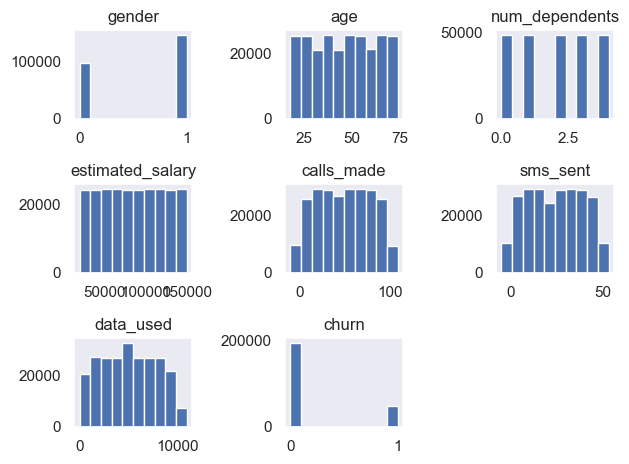

In [14]:
sns.set_theme()
procced_df.hist(grid=False);
plt.tight_layout()

In [15]:
def count_plot(dataframe: pd.DataFrame, column: pd.Series):
    """Count plot for target column to get some insights.
    
    Args:
    -----
    dataframe (pd.dataframe): The dataframe used.
    column (pd.Series): The target column used in the count plot.
    
    Returns:
    plot: a Seaborn countplot for the column entered.
    """
    sns.countplot(data=dataframe, x=column)
    plt.title(f"The Count of the feature in {column}")

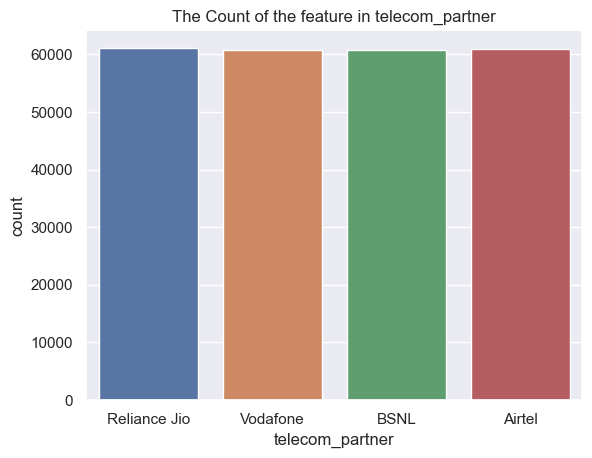

In [16]:
# See the countplot for the telecom_partner column
count_plot(procced_df, "telecom_partner");

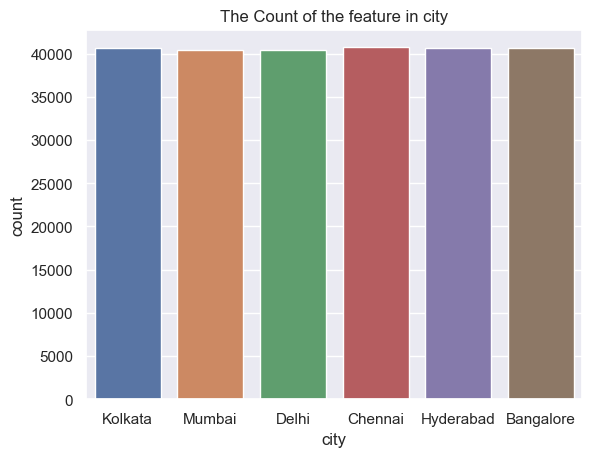

In [17]:
# See the countplot for city column
count_plot(procced_df, "city");

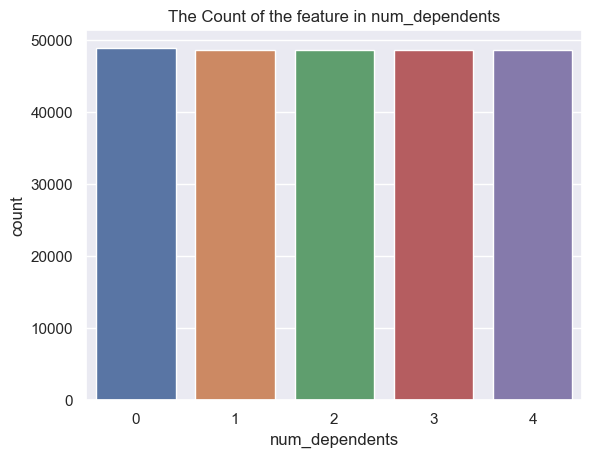

In [18]:
# See the countplot for num_dep column
count_plot(procced_df, "num_dependents");

**As i see the distrution of feature all equally likely**

## Bivariant Anaylsis

In [19]:
def scatter_plot(dataframe: pd.DataFrame, column_1: str, column_2: str):
    """Count plot for target column to get some insights.
    
    Args:
    -----
    dataframe (pd.dataframe): The dataframe used.
    column_1 (str): The first column used in the scatterplot.
    column_2 (str): The second column used to compare with in the scatterplot
    
    Returns:
    plot: a Seaborn scatterplot for the column entered.
    """
    sns.scatterplot(data=dataframe, x=column_1, y=column_2)
    plt.title(f"The Relation between {column_1} & {column_2}");

In [20]:
procced_df.columns

Index(['telecom_partner', 'gender', 'age', 'state', 'city', 'num_dependents',
       'estimated_salary', 'calls_made', 'sms_sent', 'data_used', 'churn'],
      dtype='object')

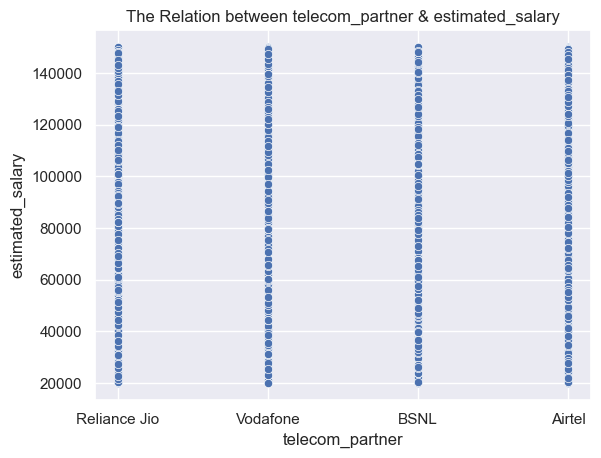

In [21]:
# See the relation between the telecom_partner and estimated_salary
scatter_plot(procced_df, "telecom_partner", "estimated_salary")

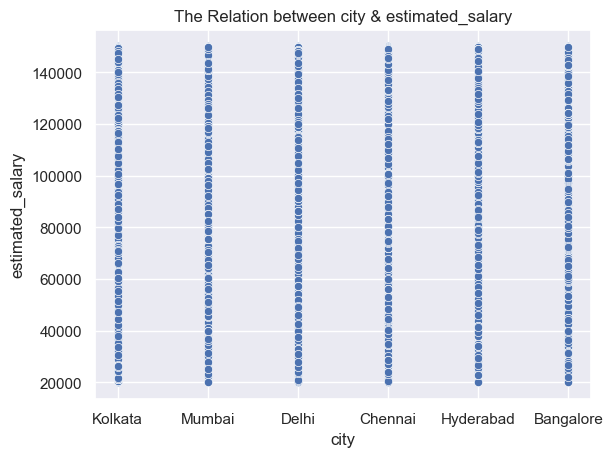

In [22]:
# See the relation between the city and estimated_salary
scatter_plot(procced_df, "city", "estimated_salary")

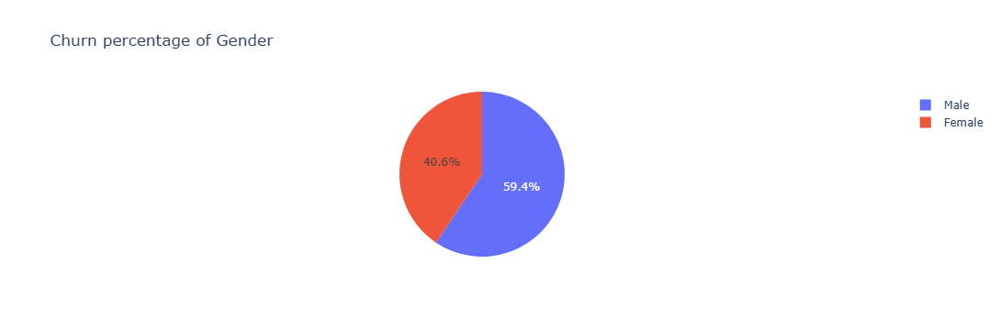

In [23]:
# See the churn percentage in age column
churn_data_gender=procced_df[procced_df['churn']==1]['gender']
gender_value=list(churn_data_gender.value_counts())

# Create the pie plot 
fig = px.pie(
    names=["Male", "Female"],
    values=gender_value,
    title="Churn percentage of Gender"
)

fig

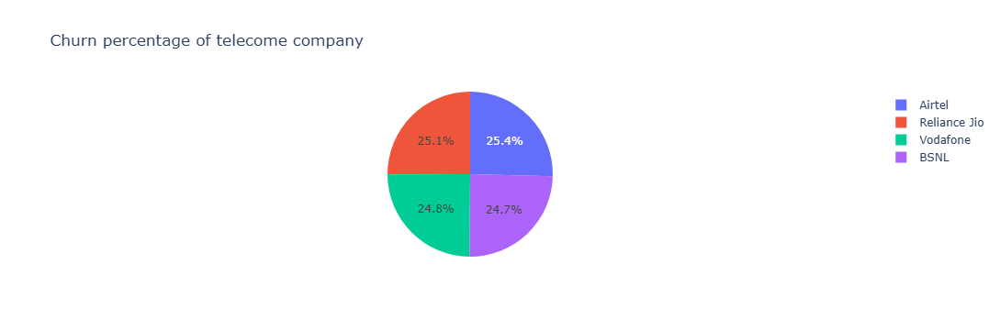

In [24]:
# See the churn percentage in telecom_partner
churn_telecom = procced_df[procced_df['churn'] == 1]["telecom_partner"]
telecom_values = list(churn_telecom.value_counts())

# Create the pie plot 
fig = px.pie(
    names=list(churn_telecom.value_counts().keys()),
    values=telecom_values,
    title="Churn percentage of telecome company"
)

fig

In [25]:
# See a histplot for the churn in call_made
churn_data_calls_made=procced_df[procced_df['churn']==1]['calls_made']
non_churn_calls_made=procced_df[procced_df['churn']==0]['calls_made']

churn_value_calls_made=list(churn_data_calls_made.value_counts().sort_values())
non_churn_value_calls_made=list(non_churn_calls_made.value_counts().sort_values())

D:\Anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

D:\Anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



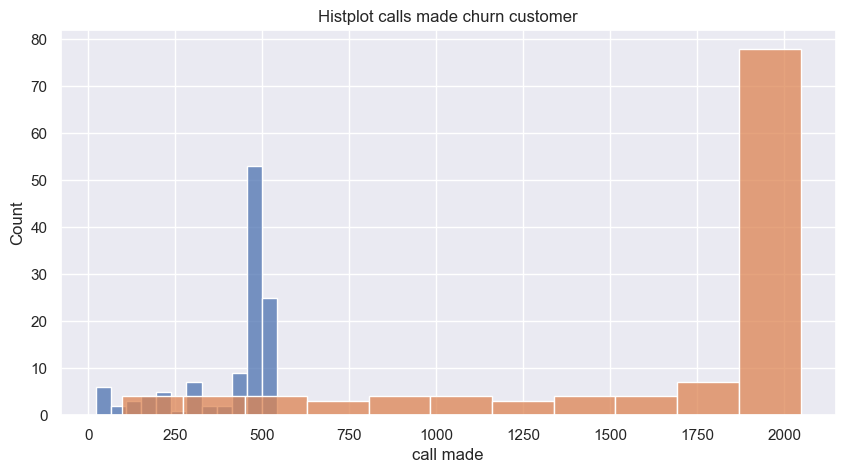

In [26]:
# Create the hisplot
plt.figure(figsize=(10,5))
sns.histplot(churn_value_calls_made)
sns.histplot(non_churn_value_calls_made)
plt.xlabel("call made")
plt.title("Histplot calls made churn customer");

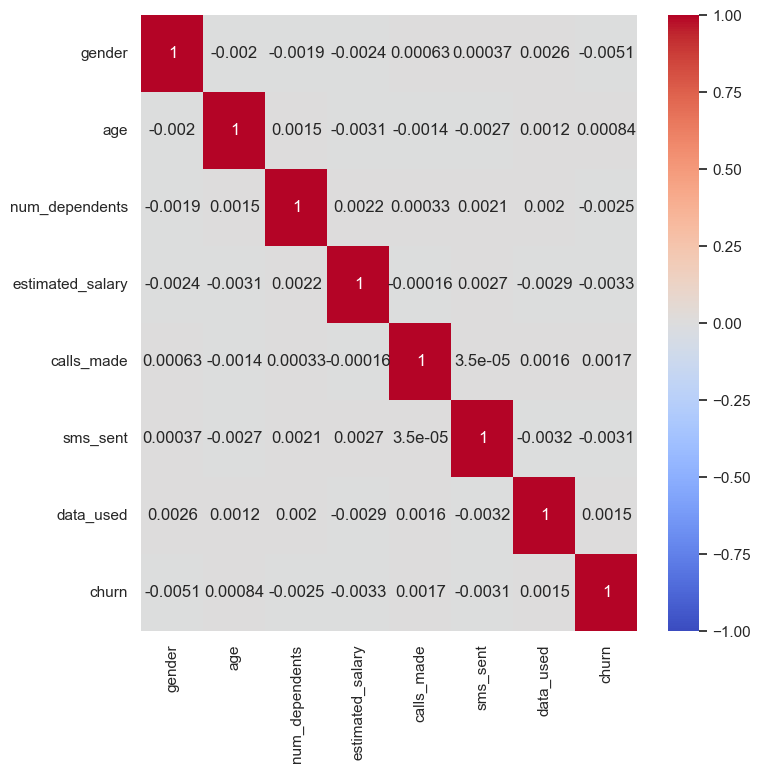

In [27]:
# See the heatmap plot to see the correlation beteen the target churn and featurs 
corr_matrix = procced_df.corr(numeric_only=True) # To ensure that only the numerical features will take 
plt.figure(figsize=(8, 8))
sns.heatmap(corr_matrix, annot=True, vmin=-1, vmax=1, cmap="coolwarm");
# plt.savefig("headmap.png");

D:\Anaconda\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



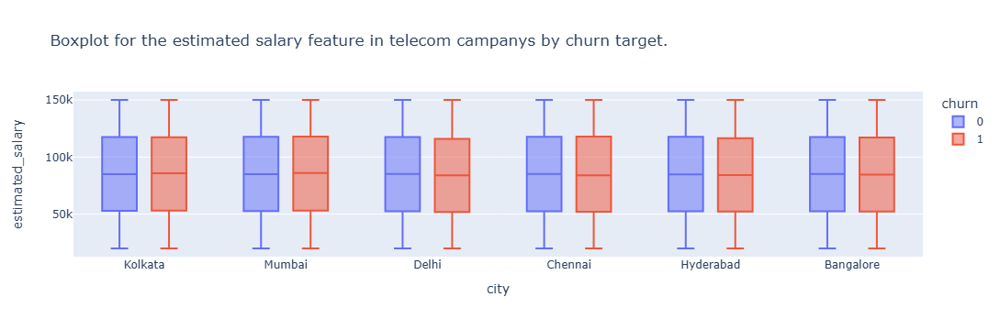

In [33]:
fig = px.box(
    procced_df,
    x="city", 
    y="estimated_salary", 
    color="churn",
    f
    title="Boxplot for the estimated salary feature in telecom campanys by churn target."
)
fig

**There is a very weak relationship between the features and me target**</br>
**Maybe the cause of the imbalance in the targe and will try to reduec it in modelling section**

# Section 2: Modelling 

## Import lib 

In [44]:
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report
from catboost import CatBoostClassifier
import numpy as np
from imblearn.over_sampling import SMOTE
import pickle as pk

## Convert the categorical features using Label encoding 

In [45]:
label_encoders = {}
for col in procced_df.columns:
    if procced_df[col].dtype == "object":
        le = LabelEncoder()
        procced_df[col] = le.fit_transform(procced_df[col])
        label_encoders[col] = le  # Save the encoder

### Save the encodeing for application 

In [47]:
with open("encoders.pkl", "wb") as f:
    pk.dump(label_encoders, f)

In [50]:
print(label_encoders["telecom_partner"].classes_)

['Airtel' 'BSNL' 'Reliance Jio' 'Vodafone']


In [14]:
procced_df.head()

,telecom_partner,gender,age,state,city,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
0,2,0,25,10,4,4,124962,44,45,4993,0
1,2,0,55,16,5,2,130556,62,39,5973,0
2,3,0,57,1,2,0,148828,49,24,193,1
3,1,1,46,22,4,1,38722,80,25,9377,1
4,1,0,26,24,2,2,55098,78,15,1393,0


## Identity the target y and feature x 

In [15]:
target = 'churn'
X = procced_df.drop(columns=target)
y = procced_df[target]

## Split the X,y data into train and test

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# See the size of the chunks 
print(f"The X train size: {len(X_train)}")
print(f"The X test size: {len(X_test)}")
print(f"The y train size: {len(y_train)}")
print(f"The y test size: {len(y_test)}")

The X train size: 170487
The X test size: 73066
The y train size: 170487
The y test size: 73066


**As i see there is unbalance problem in the dataset**<br>
**So lets create a copy of the train data using over sampling technique**

## Apply over sampling using `SMOTE` 

In [17]:
over_sampling = SMOTE()
X_train_over, y_train_over = over_sampling.fit_resample(X_train, y_train)

In [18]:
# See the shape of the train data after over sampling 
print(f"The X train data after over sampling: {len(X_train_over)}")
print(f"The y train data after over sampling: {len(y_train_over)}")

The X train data after over sampling: 272628
The y train data after over sampling: 272628


## Scaling the over sampling train data and test

In [19]:
scaler = MinMaxScaler()

X_train_over = pd.DataFrame(scaler.fit_transform(X_train_over), columns=X_train.columns)
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_train.columns)

### Save the scaling for the application 

In [20]:
with open("scale.pkl", "wb") as f:
    pk.dump(scaler, f)

## Create a baseline model e.g (Logistic Regression)

In [21]:
clf_log_over = LogisticRegression(random_state=42)

# On the over sampling train features 
clf_log_over.fit(X_train_over, y_train_over)

LogisticRegression(random_state=42)

In [22]:
# See the prediction score 
y_pred_over = clf_log_over.predict(X_test)

# See the score 
print(f"Accuracy score for Logistic model on over sampling {clf_log_over.score(X_test, y_test)}")

Accuracy score for Logistic model on over sampling 0.5681164974132976


In [23]:
# See the classification report 
print(classification_report(y_test, y_pred_over))

              precision    recall  f1-score   support

           0       0.80      0.61      0.69     58412
           1       0.20      0.40      0.27     14654

    accuracy                           0.57     73066
   macro avg       0.50      0.50      0.48     73066
weighted avg       0.68      0.57      0.61     73066



In [24]:
clf_log = LogisticRegression(random_state=42, max_iter=100000)

# On sample train data 
clf_log.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=100000, random_state=42)

In [25]:
# See the prediction score 
y_pred = clf_log.predict(X_test)

# See the score 
print(f"Accuracy score for Logistic model {clf_log.score(X_test, y_test)}")

Accuracy score for Logistic model 0.7994416007445323


In [26]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      1.00      0.89     58412
           1       0.00      0.00      0.00     14654

    accuracy                           0.80     73066
   macro avg       0.40      0.50      0.44     73066
weighted avg       0.64      0.80      0.71     73066



D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


**As i see there is  accucracy  is differant because of the overfitting due to the inbalance in the classes**

## Createing a model using `Randomforest` classifier model 

In [27]:
clf_rf_over = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)

# On the over sampling train data 
clf_rf_over.fit(X_train_over, y_train_over)

RandomForestClassifier(max_depth=5, random_state=42)

In [28]:
# See the scores 
y_pred_over = clf_rf_over.predict(X_test)

print(f"The Accuracy of RandomForest model on over sampling data: {clf_rf_over.score(X_test, y_test)}")

The Accuracy of RandomForest model on over sampling data: 0.5598499986313744


In [29]:
print(classification_report(y_test, y_pred_over))

              precision    recall  f1-score   support

           0       0.80      0.60      0.69     58412
           1       0.20      0.40      0.26     14654

    accuracy                           0.56     73066
   macro avg       0.50      0.50      0.48     73066
weighted avg       0.68      0.56      0.60     73066



In [30]:
clf_rf = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)

# On the train data 
clf_rf.fit(X_train_scaled, y_train)

RandomForestClassifier(max_depth=5, random_state=42)

In [31]:
# See the scores 
y_pred = clf_rf.predict(X_test)

print(f"The Accuracy of RandomForest model: {clf_rf.score(X_test, y_test)}")

The Accuracy of RandomForest model: 0.7994416007445323


In [32]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      1.00      0.89     58412
           1       0.00      0.00      0.00     14654

    accuracy                           0.80     73066
   macro avg       0.40      0.50      0.44     73066
weighted avg       0.64      0.80      0.71     73066



D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Createing a model using `GradientBoosting` classifier model 

In [33]:
clf_gb_over = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

clf_gbX_train_scaledX_train_over, y_train_over)

GradientBoostingClassifier(random_state=42)

In [34]:
# See the scores 
y_pred_over = clf_gb_over.predict(X_test)

print(f"The Accuracy of GradientBoosting model on over sampling data: {clf_gb_over.score(X_test, y_test)}")

The Accuracy of GradientBoosting model on over sampling data: 0.6035912736430077


In [35]:
print(classification_report(y_test, y_pred_over))

              precision    recall  f1-score   support

           0       0.80      0.67      0.73     58412
           1       0.20      0.33      0.25     14654

    accuracy                           0.60     73066
   macro avg       0.50      0.50      0.49     73066
weighted avg       0.68      0.60      0.63     73066



In [36]:
clf_gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

clf_gb.fit(X_train_scaled, y_train)

GradientBoostingClassifier(random_state=42)

In [37]:
# See the scores 
y_pred = clf_gb.predict(X_test)

print(f"The Accuracy of GradientBoosting model: {clf_gb.score(X_test, y_test)}")

The Accuracy of GradientBoosting model: 0.7994416007445323


In [38]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      1.00      0.89     58412
           1       0.00      0.00      0.00     14654

    accuracy                           0.80     73066
   macro avg       0.40      0.50      0.44     73066
weighted avg       0.64      0.80      0.71     73066



D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Createing a model using `Catboost` classifier model 

In [39]:
clf_cb_over = CatBoostClassifier(iterations=500, learning_rate=0.1, loss_function="CrossEntropy", random_state=42)

clf_cb_over.fit(X_train_over, y_train_over)

0:	learn: 0.6792857	total: 237ms	remaining: 1m 58s
1:	learn: 0.6681134	total: 310ms	remaining: 1m 17s
2:	learn: 0.6590106	total: 383ms	remaining: 1m 3s
3:	learn: 0.6516145	total: 467ms	remaining: 57.9s
4:	learn: 0.6456796	total: 515ms	remaining: 51s
5:	learn: 0.6406533	total: 540ms	remaining: 44.4s
6:	learn: 0.6363775	total: 563ms	remaining: 39.7s
7:	learn: 0.6327789	total: 585ms	remaining: 36s
8:	learn: 0.6297710	total: 619ms	remaining: 33.8s
9:	learn: 0.6272791	total: 644ms	remaining: 31.5s
10:	learn: 0.6248047	total: 668ms	remaining: 29.7s
11:	learn: 0.6226310	total: 692ms	remaining: 28.1s
12:	learn: 0.6206242	total: 715ms	remaining: 26.8s
13:	learn: 0.6189137	total: 739ms	remaining: 25.7s
14:	learn: 0.6172010	total: 761ms	remaining: 24.6s
15:	learn: 0.6157098	total: 782ms	remaining: 23.6s
16:	learn: 0.6142642	total: 803ms	remaining: 22.8s
17:	learn: 0.6128766	total: 828ms	remaining: 22.2s
18:	learn: 0.6116582	total: 852ms	remaining: 21.6s
19:	learn: 0.6104684	total: 874ms	remaining

In [40]:
y_pred_over = clf_cb_over.predict(X_test)

print(f"The Accuracy of Catboost model on over sampling data: {clf_cb_over.score(X_test, y_test)}")

The Accuracy of Catboost model on over sampling data: 0.620329565050776


In [41]:
print(classification_report(y_test, y_pred_over))

              precision    recall  f1-score   support

           0       0.80      0.70      0.75     58412
           1       0.20      0.29      0.24     14654

    accuracy                           0.62     73066
   macro avg       0.50      0.50      0.49     73066
weighted avg       0.68      0.62      0.65     73066



**As i see that the best model accuary in over_sampling is the `catboost` model**

## Save the best model

In [42]:
with open("best_model.pkl", "wb") as f:
    pk.dump(clf_cb_over, f)